In [1]:
import pandas as pd
import numpy as np
from utils import *
from joint_angles.calculate_joint_angles import *
# Import everything needed to edit video clips 
from moviepy.editor import *
# for 3d plots
import plotly.express as px
#for heatmaps
import seaborn as sns

%load_ext autoreload
%autoreload 2

# Projection of 3D points on body frame on validation data

Body frame coordinate is defined as : 
- Center coordinate : Neck
- X-axis : From left shoulder to neck
- Z-axis : From neck to hips
- Y-axis : Z cross X

With an application of Gram-Schmidt orthogonalization to ensure they are orthogonal

Where body points in the body frame will be defined as : $p' = R*p + C$

With : 
- $p$ : Coordinate of body point in original frame
- $p'$ : Coordinate of body point in body frame
- $R$ : Rotation matrix defined as :$$R =   \left(\begin{array}{cc} 
                                        X_x & Y_x & Z_x \\
                                        X_y & Y_y & Z_y \\
                                        X_z & Y_z & Z_y
                                        \end{array}\right)$$
    Where $(X_x, X_y, X_z)$ give coordinates of new X-axis in the old frame, and so on.
- $C$ : Coordinate of new center of body frame (which is neck in this case)

In [8]:
data_npy_path = "../data/data_test_31.07.npy"
data_npy = np.load(data_npy_path)

df_test = pd.DataFrame()
df_test['time'] = np.array([time/30 for time in range(len(data_npy))])
for i in range(17):
    df_point = pd.DataFrame(data_npy[:, i])
    df_test[f'point_{i}'] = df_point[[0, 1, 2]].to_numpy().tolist()
    df_test[f'point_{i}'] = [np.array(point) for point in df_test[f'point_{i}']]
df_test.rename(columns = {'point_0': 'nose', 'point_1': 'lefteye',
                          'point_2': 'righteye', 'point_3': 'leftear', 'point_4': 'rightear',
                          'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                          'point_8':'rightelbow', 'point_7':'leftelbow', 
                          'point_10':'rightwrist', 'point_9':'leftwrist',
                          'point_12':'righthip', 'point_11':'lefthip',
                          'point_13': 'leftknee', 'point_14': 'rightknee',
                          'point_15': 'leftfoot', 'point_16': 'rightfoot'}, inplace = True)

joints = ['leftshoulder_flex', 'rightshoulder_flex', 'leftshoulder_abduc',
       'rightshoulder_abduc', 'leftelbow_flex', 'rightelbow_flex',
       'trunk_forward_flex', 'trunk_lateral_flex', 'trunk_rotation']
df_test['neck'] = (df_test['leftshoulder'] + df_test['rightshoulder'])/2
df_test['hips'] = (df_test['lefthip'] + df_test['righthip'])/2
# Add joints DoF
add_joint_angles(df_test)
#add_joint_velocities(df_test, joints)

In [107]:
X = df_test['leftshoulder'] - df_test['neck']
Z = df_test['hips'] - df_test['neck']

X = [unit_vector(x) for x in X]
Z = [unit_vector(-z) for z in Z]
Y = np.cross(X, Z)
#A = [np.array([x, z]).T for x, z in zip(X, Z)]
#A = [gram_schmidt(a).T for a in A]
A = [np.array([x, z, y]) for x, z, y in zip(X, Z, Y)]
A = [gram_schmidt(a) for a in A]
X_o = [a[0] for a in A]
Z_o = [a[1] for a in A]
Y_o = [a[2] for a in A]

In [117]:
print('Original vectors :')
print(f'X : {X[3]} and Z : {Z[3]}')
print(f'Dot product : {np.dot(X[3], Z[3])}')

print('Orthogonalized vectors : ')
print(f'X : {X_o[3]} and Z : {Z_o[3]}')
print(f'Dot product : {np.dot(X_o[3], Z_o[3])}')
print(f'Dot product : {np.dot(X_o[3], Y_o[3])}')
print(f'Dot product : {np.dot(Y_o[3], Z_o[3])}')

Original vectors :
X : [ 0.28482847  0.87063081 -0.40109193] and Z : [0.23838231 0.47024062 0.84973386]
Dot product : 0.13648264314609904
Orthogonalized vectors : 
X : [ 0.28482847  0.87063081 -0.40109193] and Z : [0.20139271 0.35473406 0.91301956]
Dot product : 0.0
Dot product : -1.3877787807814457e-17
Dot product : -1.3877787807814457e-17


The Gram-Schmidt process seems to work, the dot product is near 0. This algorithm is validated and can be included in the  ```rotate_points``` function.

In [119]:
R = [np.array([x, y, z]) for x, y, z in zip(X_o, Y_o, Z_o)]
idx = 3
point = df_test['nose'][idx]
vectors = R[idx]
center = df_test['neck'][idx]
print(f'Original coordinates : {point}')
print(f'Transformation to body coordinates : {transform_to_new_coordinates(point, vectors, center)}')

Original coordinates : [ 1.4512707   0.13994993 -0.07904133]
Transformation to body coordinates : [0.21441029 0.16588467 0.08040814]


Let's define the normal vector of the best fitted plane to both feet points

In [3]:
from skspatial.objects import Plane, Points
#Took so much time when using both feet points
feet_points = np.concatenate((df_test['leftfoot'][::3], df_test['rightfoot'][::3]))
feet_points = [a for a in feet_points]

points = Points(feet_points)
#feet_points.append(df_test['rightfoot'])
plane = Plane.best_fit(points)
print(f'Normal vector of the plane : {plane.normal}')

Normal vector of the plane : [0.02655598 0.11571828 0.99292702]


In [262]:
middle_feet = (df_test['leftfoot'] + df_test['rightfoot'])/2
middle_feet_proj = np.array([plane.project_point(a) for a in middle_feet])

In [4]:
def transform_points(data, plane):
    feet_points = np.concatenate((df_test['leftfoot'], df_test['rightfoot']))
    feet_points = [a for a in feet_points]

    points = Points(feet_points)
    #feet_points.append(df_test['rightfoot'])
    plane = Plane.best_fit(points)
    
    middle_feet = (data['leftfoot'] + data['rightfoot'])/2
    middle_feet = np.array([plane.project_point(a) for a in middle_feet])
    leftfoot = np.array([np.array(a) for a in data['leftfoot']])
    hips = np.array([np.array(a) for a in data['hips']])
    X = leftfoot - middle_feet 
    Z = hips - middle_feet
    
    #hips_proj = np.array([plane.project_point(a) for a in data['hips']])
    #hips = np.array([np.array(a) for a in data['hips']])
    #Z = hips - hips_proj
    X = [plane.project_vector(x) for x in X]
    #Z = [plane.normal.project_vector(z) for z in Z]
    C = middle_feet

    """ middle_feet = (data['leftfoot'] + data['rightfoot'])/2
    X = data['leftfoot'] - middle_feet
    Z = data['neck'] - middle_feet
    C = middle_feet """

    #X = data['leftshoulder'] - data['neck']
    #Z = data['hips'] - data['neck']
    #C = [np.array(c) for c in data['neck']]

    #Axis of coordinate system should be unit vector
    X = [np.array(x) for x in X]
    Z = [np.array(z) for z in Z]
    Y = np.cross(X, Z)
    
    #Orthogonalization of these 3 axises using Gram-Schmidt process
    A = [np.array([x, y, z]) for x, y, z in zip(X, Y, Z)]
    #A = [np.array([x, y, Z]) for x, y in zip(X, Y)]
    R = [gram_schmidt(a) for a in A]
    
    #body joints transformed to body frame coordinates
    new_df = pd.DataFrame()
    keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
            'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
            'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
            'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips']
    for key in keys:
        #new_df[key] = [transform_to_new_coordinates(point, R[0], C[0]) for point in data[key]]
        new_df[key] = [transform_to_new_coordinates(point, r, c) for point, r, c in zip(data[key], R, C)]
    new_df['time'] = data['time']
    return new_df

new_df_test = transform_points(df_test, plane)
#video_skeleton('check_new_body_frame4', new_df_test, 70, 71)
#video_skeleton('check_skeleton', df_test, 70, 71)


(<unknown>:33926): GStreamer-CRITICAL **: 17:39:22.711: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@26278.244] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@26278.246] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/check_skeleton.avi in function 'icvExtractPattern'




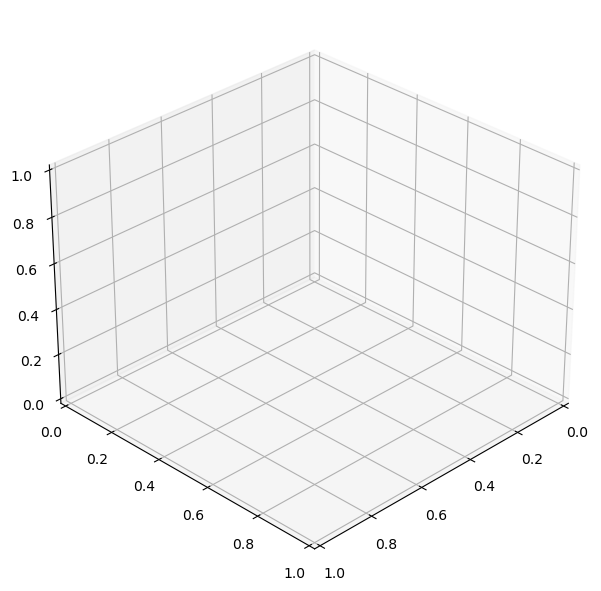

In [277]:
video_skeleton('check_skeleton', df_test, 65, 71)

In [6]:
events = {'shoulder_flex' : [65, 98],
          'shoulder_rot' : [99, 132],
          'shoulder_abduc' : [262, 304],
          'elbow_flex' : [133, 192],
          'trunk_fwd_flex' : [192, 214],
          'trunk_lat_flex' : [214, 233],
          'trunk_rot' : [233, 249]}

In [564]:
#df_test.to_csv('raw_features.csv')

### Check for shoulder flexion

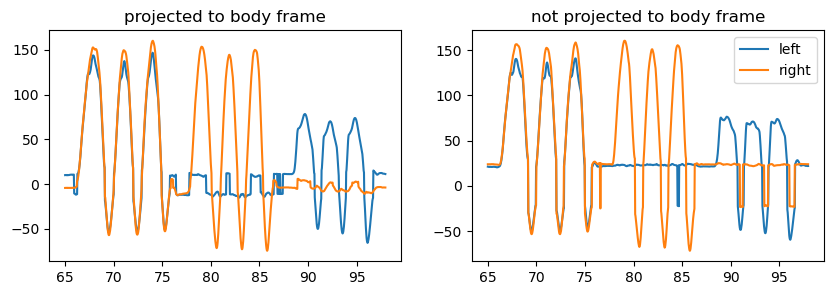

In [10]:
leftshoulder_flex = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'sagittal')
rightshoulder_flex = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'sagittal')
t1, t2 = time_id(new_df_test, events['shoulder_flex'][0], events['shoulder_flex'][1])

fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1:t2], leftshoulder_flex[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightshoulder_flex[t1:t2], label = 'right')
plt.title('projected to body frame')
plt.subplot(1, 2, 2)
plt.plot(df_test['time'][t1:t2], df_test['leftshoulder_flex'][t1:t2], label = 'left')
plt.plot(df_test['time'][t1:t2], df_test['rightshoulder_flex'][t1:t2], label = 'right')
plt.title('not projected to body frame')
plt.legend()

### Check for shoulder abduction

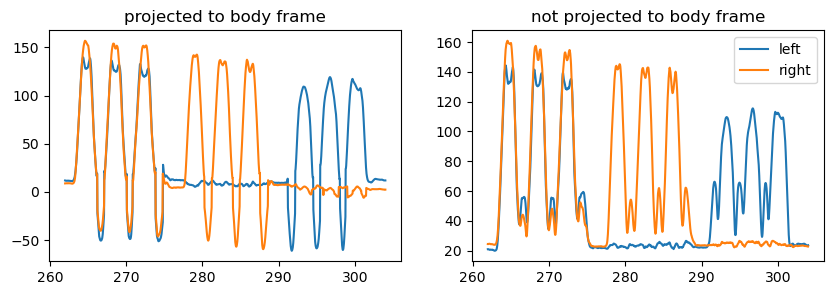

In [11]:
leftshoulder_abduc = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'coronal')
rightshoulder_abduc = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'coronal')
t1, t2 = time_id(new_df_test, events['shoulder_abduc'][0], events['shoulder_abduc'][1])

fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1:t2], leftshoulder_abduc[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightshoulder_abduc[t1:t2], label = 'right')
plt.title('projected to body frame')
plt.subplot(1, 2, 2)
plt.plot(df_test['time'][t1:t2], df_test['leftshoulder_abduc'][t1:t2], label = 'left')
plt.plot(df_test['time'][t1:t2], df_test['rightshoulder_abduc'][t1:t2], label = 'right')
plt.title('not projected to body frame')
plt.legend()

### Check for shoulder rotation

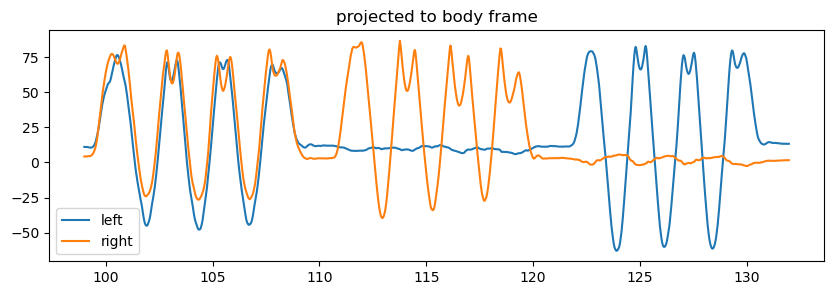

In [14]:
leftshoulder_rot = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'transverse')
rightshoulder_rot = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'transverse')
t1, t2 = time_id(new_df_test, events['shoulder_rot'][0], events['shoulder_rot'][1])

fig = plt.figure(figsize=(10,3))
plt.plot(new_df_test['time'][t1:t2], leftshoulder_rot[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightshoulder_rot[t1:t2], label = 'right')
plt.title('projected to body frame')

plt.legend()

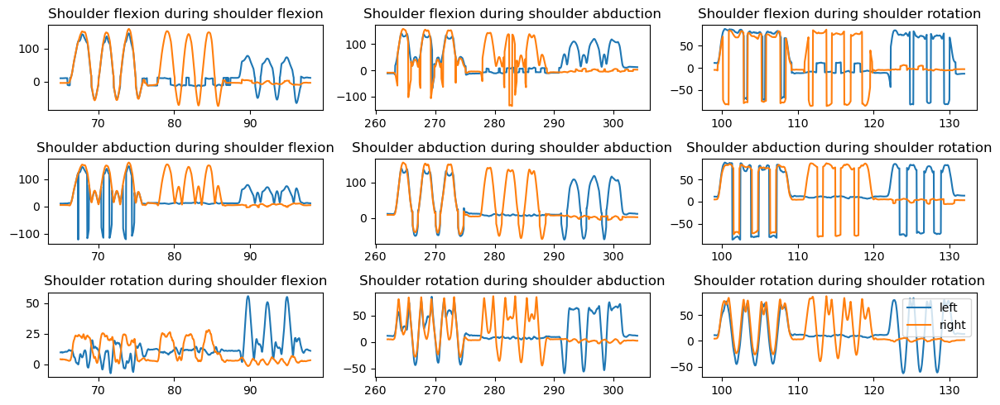

In [15]:
#Check shoulder movements during all shoulder movements
t1_flex, t2_flex = time_id(new_df_test, events['shoulder_flex'][0], events['shoulder_flex'][1])
t1_abduc, t2_abduc = time_id(new_df_test, events['shoulder_abduc'][0], events['shoulder_abduc'][1])
t1_rot, t2_rot = time_id(new_df_test, events['shoulder_rot'][0], events['shoulder_rot'][1])


fig = plt.figure(figsize=(12,5))
plt.subplot(3, 3, 1)
plt.plot(new_df_test['time'][t1_flex:t2_flex], leftshoulder_flex[t1_flex:t2_flex], label = 'left')
plt.plot(new_df_test['time'][t1_flex:t2_flex], rightshoulder_flex[t1_flex:t2_flex], label = 'right')
plt.title('Shoulder flexion during shoulder flexion')
plt.subplot(3, 3, 2)
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], leftshoulder_flex[t1_abduc:t2_abduc], label = 'left')
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], rightshoulder_flex[t1_abduc:t2_abduc], label = 'right')
plt.title('Shoulder flexion during shoulder abduction')
plt.subplot(3, 3, 3)
plt.plot(new_df_test['time'][t1_rot:t2_rot], leftshoulder_flex[t1_rot:t2_rot], label = 'left')
plt.plot(new_df_test['time'][t1_rot:t2_rot], rightshoulder_flex[t1_rot:t2_rot], label = 'right')
plt.title('Shoulder flexion during shoulder rotation')

plt.subplot(3, 3, 4)
plt.plot(new_df_test['time'][t1_flex:t2_flex], leftshoulder_abduc[t1_flex:t2_flex], label = 'left')
plt.plot(new_df_test['time'][t1_flex:t2_flex], rightshoulder_abduc[t1_flex:t2_flex], label = 'right')
plt.title('Shoulder abduction during shoulder flexion')
plt.subplot(3, 3, 5)
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], leftshoulder_abduc[t1_abduc:t2_abduc], label = 'left')
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], rightshoulder_abduc[t1_abduc:t2_abduc], label = 'right')
plt.title('Shoulder abduction during shoulder abduction')
plt.subplot(3, 3, 6)
plt.plot(new_df_test['time'][t1_rot:t2_rot], leftshoulder_abduc[t1_rot:t2_rot], label = 'left')
plt.plot(new_df_test['time'][t1_rot:t2_rot], rightshoulder_abduc[t1_rot:t2_rot], label = 'right')
plt.title('Shoulder abduction during shoulder rotation')

plt.subplot(3, 3, 7)
plt.plot(new_df_test['time'][t1_flex:t2_flex], leftshoulder_rot[t1_flex:t2_flex], label = 'left')
plt.plot(new_df_test['time'][t1_flex:t2_flex], rightshoulder_rot[t1_flex:t2_flex], label = 'right')
plt.title('Shoulder rotation during shoulder flexion')
plt.subplot(3, 3, 8)
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], leftshoulder_rot[t1_abduc:t2_abduc], label = 'left')
plt.plot(new_df_test['time'][t1_abduc:t2_abduc], rightshoulder_rot[t1_abduc:t2_abduc], label = 'right')
plt.title('Shoulder rotation during shoulder abduction')
plt.subplot(3, 3, 9)
plt.plot(new_df_test['time'][t1_rot:t2_rot], leftshoulder_rot[t1_rot:t2_rot], label = 'left')
plt.plot(new_df_test['time'][t1_rot:t2_rot], rightshoulder_rot[t1_rot:t2_rot], label = 'right')
plt.title('Shoulder rotation during shoulder rotation')
fig.tight_layout()
plt.legend()

### (Check elbow flexion)
No projection on body frame, since it is only the naive angle between shoulder-elbow-wrist. At least it still works with 3D body points projected to body frames.

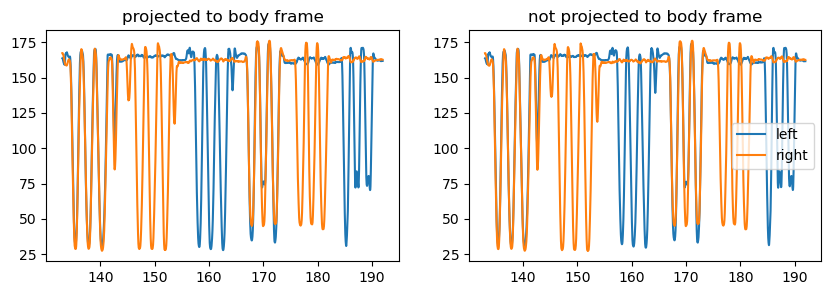

In [459]:
A = new_df_test['leftshoulder'] - new_df_test['leftelbow']
B = new_df_test['leftwrist'] - new_df_test['leftelbow']

angle = [np.dot(unit_vector(a), unit_vector(b)) for a, b in zip(A, B)]
leftelbow_flex = np.arccos(angle)*180/np.pi

A = new_df_test['rightelbow'] - new_df_test['rightshoulder']
B = new_df_test['rightelbow'] - new_df_test['rightwrist']

angle = [np.dot(unit_vector(a), unit_vector(b)) for a, b in zip(A, B)]
rightelbow_flex = np.arccos(angle)*180/np.pi

t1, t2 = time_id(new_df_test, events['elbow_flex'][0], events['elbow_flex'][1])

fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1:t2], leftelbow_flex[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightelbow_flex[t1:t2], label = 'right')
plt.title('projected to body frame')
plt.subplot(1, 2, 2)
plt.plot(df_test['time'][t1:t2], df_test['leftelbow_flex'][t1:t2], label = 'left')
plt.plot(df_test['time'][t1:t2], df_test['rightelbow_flex'][t1:t2], label = 'right')
plt.title('not projected to body frame')
plt.legend()

### Check trunk forward flex
Still not good, which is not surprising since the trunk is quite the z - axis of the body frame. Still have to use the 3D body points in old cartesian frames.

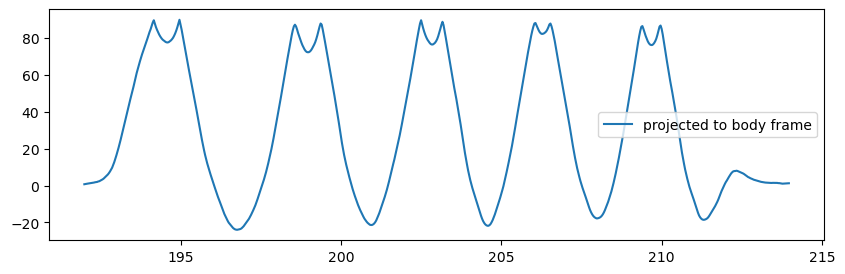

In [109]:
trunk_fwd_flex = angle_plane(df_test, trunk=True)
""" A = new_df_test['rightshoulder'] - new_df_test['hips']
B = new_df_test['leftshoulder'] - new_df_test['hips']
N = [np.cross(a, b) for a, b in zip(A, B)]
v_z = np.array([0, 0, 1])

V1_u = [unit_vector(n) for n in N]
DOT = [np.dot(v1_u, v_z) for v1_u in V1_u]
trunk_fwd_flex = 90 - np.arccos(DOT)*180/np.pi """

t1, t2 = time_id(new_df_test, events['trunk_fwd_flex'][0], events['trunk_fwd_flex'][1])

fig = plt.figure(figsize=(10,3))
plt.plot(new_df_test['time'][t1:t2], trunk_fwd_flex[t1:t2], label = 'projected to body frame')
#plt.plot(new_df_test['time'][t1:t2], df_test['trunk_forward_flex'][t1:t2], label ='not projected')

plt.legend()

### Check trunk lateral flexion
For now no solution with a way to project to body frame. Just naive angle between neck-hips and righthip-hips for now. At least we can use the projected points to body frame

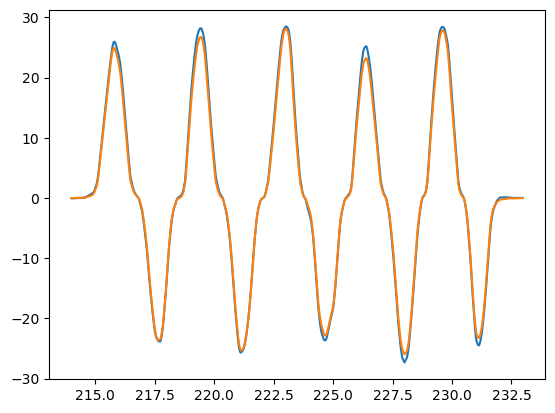

In [21]:
trunk_lat_flex = angle_plane(new_df_test, trunk=True, plane = 'coronal')

t1, t2 = time_id(new_df_test, events['trunk_lat_flex'][0], events['trunk_lat_flex'][1])
plt.plot(df_test['time'][t1:t2], trunk_lat_flex[t1:t2])
plt.plot(df_test['time'][t1:t2], df_test['trunk_lateral_flex'][t1:t2])


### (Check trunk transverse rotation)

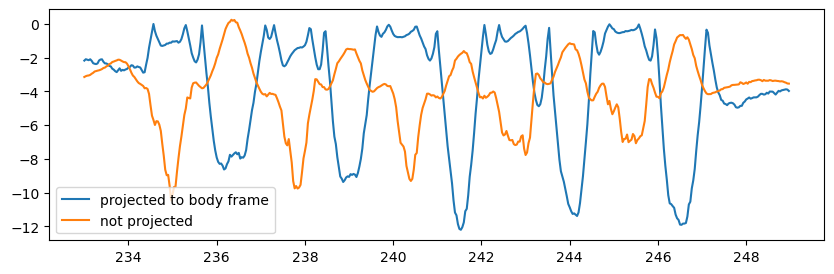

In [456]:
trunk_rot = angle_plane(new_df_test, jointA='leftshoulder', jointB='neck', plane = 'transverse', trunk = True)
t1, t2 = time_id(new_df_test, events['trunk_rot'][0], events['trunk_rot'][1])

fig = plt.figure(figsize=(10,3))
plt.plot(new_df_test['time'][t1:t2], trunk_rot[t1:t2], label = 'projected to body frame')
plt.plot(new_df_test['time'][t1:t2], df_test['trunk_rotation'][t1:t2], label ='not projected')

plt.legend()

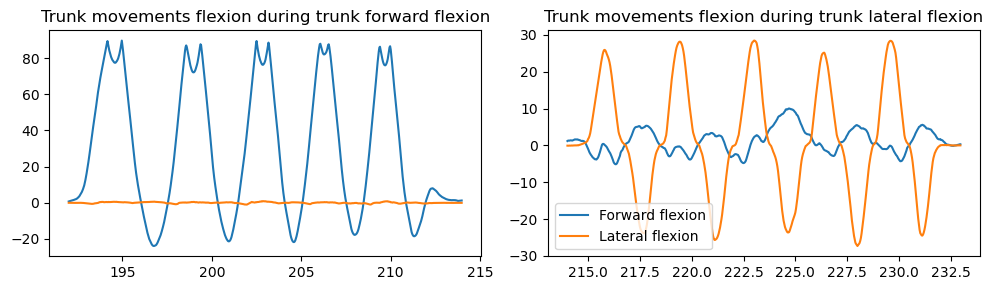

In [24]:
# Check trunk angles during trunk movements
t1_fwd, t2_fwd = time_id(new_df_test, events['trunk_fwd_flex'][0], events['trunk_fwd_flex'][1])
t1_lat, t2_lat = time_id(new_df_test, events['trunk_lat_flex'][0], events['trunk_lat_flex'][1])


fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1_fwd:t2_fwd], trunk_fwd_flex[t1_fwd:t2_fwd], label = 'Forward flexion')
plt.plot(new_df_test['time'][t1_fwd:t2_fwd], trunk_lat_flex[t1_fwd:t2_fwd], label = 'Lateral flexion')
plt.title('Trunk movements flexion during trunk forward flexion')

plt.subplot(1, 2, 2)
plt.plot(new_df_test['time'][t1_lat:t2_lat], trunk_fwd_flex[t1_lat:t2_lat], label = 'Forward flexion')
plt.plot(new_df_test['time'][t1_lat:t2_lat], trunk_lat_flex[t1_lat:t2_lat], label = 'Lateral flexion')
plt.title('Trunk movements flexion during trunk lateral flexion')
fig.tight_layout()
plt.legend()

## Add angles joint in dataframe

In [51]:
new_df_test['leftshoulder_flex'] = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'sagittal')
new_df_test['rightshoulder_flex'] = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'sagittal')

new_df_test['leftshoulder_abduc'] = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'coronal')
new_df_test['rightshoulder_abduc'] = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'coronal')

new_df_test['leftshoulder_rot'] = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'transverse')
new_df_test['rightshoulder_rot'] = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'transverse')

A = new_df_test['leftshoulder'] - new_df_test['leftelbow']
B = new_df_test['leftwrist'] - new_df_test['leftelbow']

angle = [np.dot(unit_vector(a), unit_vector(b)) for a, b in zip(A, B)]
new_df_test['leftelbow_flex']= np.arccos(angle)*180/np.pi

A = new_df_test['rightelbow'] - new_df_test['rightshoulder']
B = new_df_test['rightelbow'] - new_df_test['rightwrist']

angle = [np.dot(unit_vector(a), unit_vector(b)) for a, b in zip(A, B)]
new_df_test['rightelbow_flex'] = np.arccos(angle)*180/np.pi


new_df_test['trunk_fwd_flex'] = angle_plane(df_test, trunk=True)

new_df_test['trunk_lat_flex'] = angle_plane(new_df_test, trunk=True, plane = 'coronal')

## Add positions velocities/acceleration
Be careful with these, 3D body points projection to body frame must be first correct

In [18]:
keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot']

In [19]:
times = new_df_test['time']
n = len(new_df_test) - 1
for key in keys:
    velocities = [0]
    for i in range(n):
        a = new_df_test[key][i]
        b = new_df_test[key][i+1]
        dist = np.linalg.norm(b-a)
        w = dist/(times[i+1] - times[i])
        velocities.append(w)
    new_df_test[key +'_w'] = velocities

for key in keys:
    accelerations = [0,0]
    w = new_df_test[key+'_w']
    for i in range(n-1):
        a_i = (w[i+1] - w[i])/(times[i+1] - times[i])
        accelerations.append(a_i)

    new_df_test[key+'_a'] = accelerations

## Add angular velocities and acceleration

In [99]:
joints = ['leftshoulder_flex', 'rightshoulder_flex', 'leftshoulder_abduc',
       'rightshoulder_abduc', 'leftshoulder_rot', 'rightshoulder_rot',
       'leftelbow_flex', 'rightelbow_flex', 'trunk_fwd_flex', 'trunk_lat_flex', 
       'leftshoulder_angle', 'rightshoulder_angle', 'leftelbow_angle', 'rightelbow_angle', 'hips_angle']

In [100]:
times = new_df_test['time']
n = len(new_df_test) - 1
for joint in joints:
    velocities = [0]
    for i in range(n):
        a = new_df_test[joint][i]
        b = new_df_test[joint][i+1]
        dist = np.linalg.norm(b-a)
        w = dist/(times[i+1] - times[i])
        velocities.append(w)
    new_df_test[joint +'_w'] = velocities

for joint in joints:
    accelerations = [0,0]
    w = new_df_test[joint+'_w']
    for i in range(n-1):
        a_i = (w[i+1] - w[i])/(times[i+1] - times[i])
        accelerations.append(a_i)

    new_df_test[joint+'_a'] = accelerations

## Add naive angles

In [62]:
add_naive_joint_angles(new_df_test, 'leftshoulder', 'leftelbow', 'leftwrist')
add_naive_joint_angles(new_df_test, 'rightshoulder', 'rightelbow', 'rightwrist')

add_naive_joint_angles(new_df_test, 'lefthip', 'leftshoulder', 'leftelbow')
add_naive_joint_angles(new_df_test, 'righthip', 'rightshoulder', 'rightelbow')

add_naive_joint_angles(new_df_test, 'righthip', 'hips', 'neck')

## Add centroids

Centroid of : 
- R/L - wrist, elbow, shoulder --> 2 centroids
- R+L wrist, elbow, shoulder --> 1 centroid
- shoulders and hips together --> 1 centroid

Be careful, 3D body points projections to body plane must be corrected for these features to work

In [63]:
def add_centroid(data, joints, name):
    sum = 0
    for joint in joints:
        sum = sum + data[joint]

    centroid = sum/len(joints)
    data[name] = centroid

In [64]:
add_centroid(new_df_test, ['leftshoulder', 'leftelbow', 'leftwrist'], 'leftarm_centroid')
add_centroid(new_df_test, ['rightshoulder', 'rightelbow', 'rightwrist'], 'rightarm_centroid')
add_centroid(new_df_test, ['leftshoulder', 'leftelbow', 'leftwrist', 'rightshoulder', 'rightelbow', 'rightwrist'], 'arms_centroid')
add_centroid(new_df_test, ['leftshoulder', 'rightshoulder', 'righthip', 'lefthip'], 'trunk_centroid')

In [29]:
t1, t2 = time_id(new_df_test, events['shoulder_flex'][0], events['shoulder_flex'][1])
print(t1)

1950


In [ ]:
#plot centroids
fig, ax = fmdlgdf
plot_skeleton(new_df_test, 2700)

In [536]:
#new_df_test.to_csv('primary_features.csv')

In [50]:
new_df_test.columns.values

array(['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips', 'time',
       'leftarm_centroid', 'rightarm_centroid', 'arms_centroid',
       'trunk_centroid'], dtype=object)

In [31]:
def trim_video(file_name,vid,start,end):
	out = cv2.VideoWriter(f'videos/{file_name}.avi',cv2.VideoWriter_fourcc(*'MJPG'), FPS, (1280,720))
	i=0
	while vid.isOpened():
		# print(i)
		ret,frame = vid.read()
		if i >start and i <end:
			if ret == True:
				out.write(frame)
		if i > end:
			break
		i+=1
	out.release

In [101]:
FPS = 30
CL_video_path = 'videos/output0.mp4'

for event in events.values():
    CL_video = cv2.VideoCapture(str(CL_video_path))
    t1, t2 = time_id(new_df_test, event[0], event[1])
    trim_video(f'raw_{event}', CL_video, t1, t2)

[ WARN:0@9554.018] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@9554.039] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'



(<unknown>:3808): GStreamer-CRITICAL **: 15:47:49.084: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@9554.699] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ WARN:0@9578.326] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.c

### Add filtered velocities and accelerations (simple moving average)

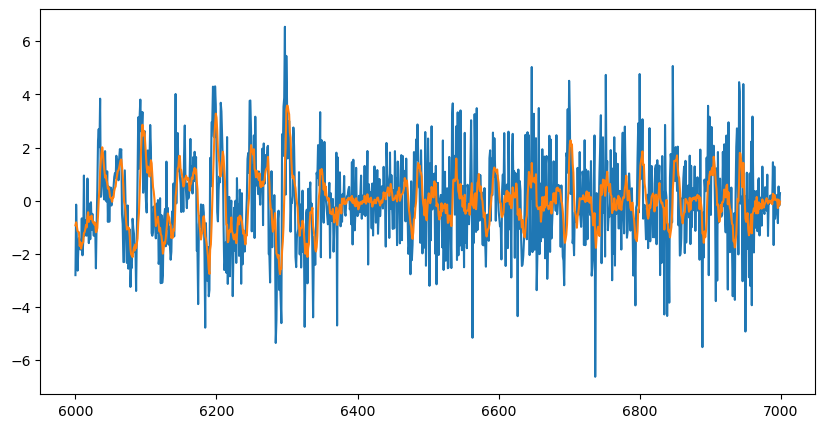

In [26]:
filtered = new_df_test['nose_a'].rolling(7).mean()
plt.figure(figsize=(10,5))
plt.plot(new_df_test['nose_a'][6000:7000])
plt.plot(filtered[6000:7000])

## 2nd Features Compute ROM, mean and std on each event

In [65]:
keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips', 'time', 
       'leftarm_centroid', 'rightarm_centroid', 'arms_centroid', 'trunk_centroid']

In [66]:
sec_features = pd.DataFrame()

colnames = new_df_test.drop(labels = keys, axis = 1).columns.values

for col in colnames:
    columns = []
    for t1, t2 in events.values():
        idx1, idx2 = time_id(new_df_test, t1, t2)
        sum_stats = new_df_test[[col]][idx1:idx2].describe()
        sum_stats = sum_stats[col].to_dict()
        sum_stats['RoM'] = sum_stats['max'] - sum_stats['min']
        columns.append(sum_stats)
    sec_features[col] = columns

In [67]:
indexes = {i: event for i, event in zip(range(len(events)), events.keys())}
sec_features.index.name = 'Events'
sec_features.rename(index = indexes, inplace = True)

In [70]:
sec_features.index

Index(['shoulder_flex', 'shoulder_rot', 'shoulder_abduc', 'elbow_flex',
       'trunk_fwd_flex', 'trunk_lat_flex', 'trunk_rot'],
      dtype='object', name='Events')

In [71]:
events.keys()

dict_keys(['shoulder_flex', 'shoulder_rot', 'shoulder_abduc', 'elbow_flex', 'trunk_fwd_flex', 'trunk_lat_flex', 'trunk_rot'])

In [106]:
few_joints = ['leftshoulder_flex', 'rightelbow_flex', 'trunk_fwd_flex', 'leftshoulder_flex_w']
RoM = []
mean = []
std = []
median = []
for event in events.keys():
    RoM.append(sec_features['trunk_fwd_flex_a'][event]['RoM'])
    mean.append(sec_features['trunk_fwd_flex_a'][event]['mean'])
    std.append(sec_features['trunk_fwd_flex_a'][event]['std'])
    median.append(sec_features['trunk_fwd_flex_a'][event]['50%'])

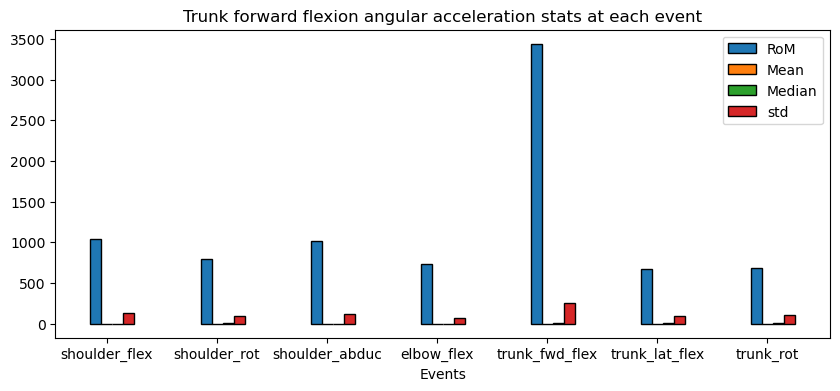

In [107]:
# width of the bars
barWidth = 0.1

# The x position of bars
r1 = np.arange(len(RoM))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]


plt.figure(figsize=(10,4))

plt.bar(x = r1, height = RoM, width = barWidth, label = 'RoM', edgecolor = 'black')
plt.bar(x = r2, height = mean, width = barWidth, label = 'Mean', edgecolor = 'black')
plt.bar(x = r3, height = median, width = barWidth, label = 'Median', edgecolor = 'black')
plt.bar(x = r4, height = std, width = barWidth, label = 'std', edgecolor = 'black')

# general layout
plt.xticks([r + barWidth for r in range(len(mean))], events.keys())

plt.title('Trunk forward flexion angular acceleration stats at each event')
plt.xlabel('Events')
plt.legend()
fig.tight_layout()
plt.show()

In [69]:
for event in sec_features:  
    sec_features['leftshoulder_flex']['shoulder_flex']

{'count': 990.0,
 'mean': 26.024903321001066,
 'std': 47.700587649552645,
 'min': -69.76321624308743,
 '25%': -11.524016928321089,
 '50%': 12.316833020112675,
 '75%': 51.98545109187441,
 'max': 145.08845393361628,
 'RoM': 214.8516701767037}

In [563]:
#sec_features.to_csv('secondary_features.csv')

# Now back to fix 3D points coordinate transform


(<unknown>:79890): GStreamer-CRITICAL **: 16:11:14.039: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@136459.632] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@136459.637] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/check_body_frame_projection.avi in function 'icvExtractPattern'




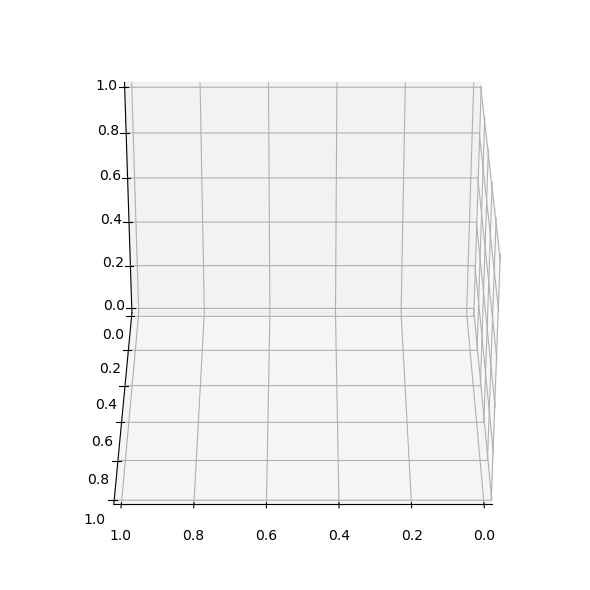

In [528]:
def rotate_points(data):

    X = data['leftshoulder'] - data['neck']
    Z = data['hips'] - data['neck']

    # Axis of coordinate system should be unit vector
    X = [unit_vector(x) for x in X]
    Z = [unit_vector(z) for z in Z]
    Y = np.cross(Z, X)

    #Create rotation matrix
    R = [np.array([x, y, -z]).T for x, y, z in zip(X, Y, Z)]
    C = [np.array(c) for c in data['neck']]

    #new body joints to body frame coordinates
    new_df = pd.DataFrame()
    keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips']
    for key in keys:
        new_df[key] = [np.dot(r, point-c) for r, point, c in zip(R, data[key], C)]

    new_df['time'] = data['time']
    return new_df

df_test1 = rotate_points(df_test)
video_skeleton('check_body_frame_projection', df_test1, 70, 71)


(<unknown>:79890): GStreamer-CRITICAL **: 17:49:04.690: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@142328.219] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@142328.221] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/check_body_frame_projection.avi in function 'icvExtractPattern'




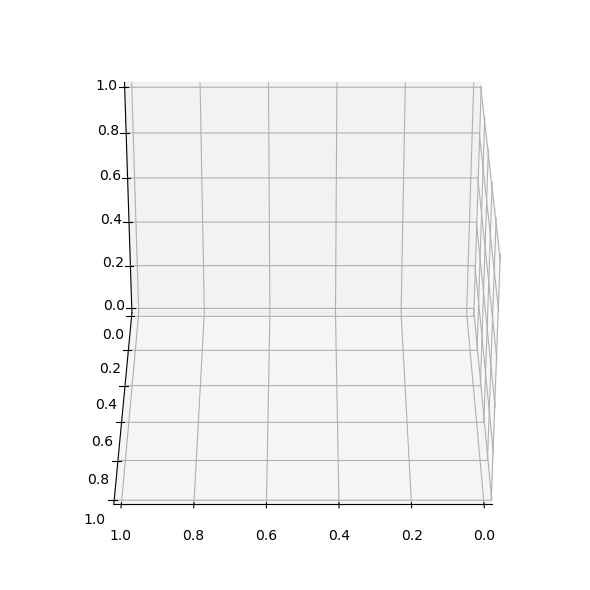

In [532]:
def rotate_points2(data):
    X = data['leftshoulder'] - data['neck']
    Z = data['hips'] - data['neck']

    # Axis of coordinate system should be unit vector
    X = [unit_vector(x) for x in X]
    Z = [unit_vector(z) for z in Z]
    Y = np.cross(Z, X)
    C = [np.array(c) for c in data['neck']]

    #Create coordinate transformation matrix
    A = [np.array([np.append(x, 0), np.append(y, 0), -np.append(z, 0), -np.append(c, 1)]).T for x, y, z, c in zip(X, Y, Z, C)]
        #new body joints to body frame coordinates
    new_df = pd.DataFrame()
    keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips']
    for key in keys:
        new_df[key] = [np.dot(a, np.append(point, 1))[:-1] for a, point in zip(A, data[key])]

    new_df['time'] = data['time']
    return new_df

new_df_test2 = rotate_points2(df_test)
video_skeleton('check_body_frame_projection', new_df_test2, 70, 72)
    


(<unknown>:79890): GStreamer-CRITICAL **: 11:09:43.251: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@150360.080] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements



(<unknown>:79890): GStreamer-CRITICAL **: 11:13:49.118: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@150605.945] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements

(<unknown>:79890): GStreamer-CRITICAL **: 11:17:25.828: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@150822.651] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements

(<unknown>:79890): GStreamer-CRITICAL **: 11:23:31.420: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@151188.247] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements

(<unknown>:79890): GStreamer-CRITICAL **: 11:28:50.577: gst_element_m

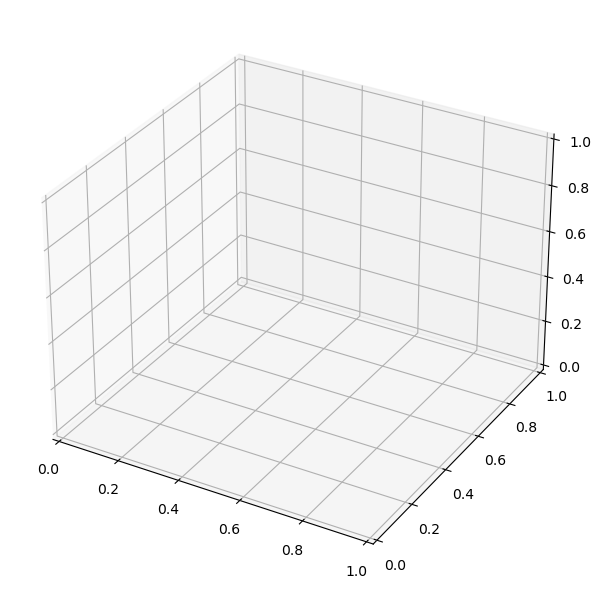

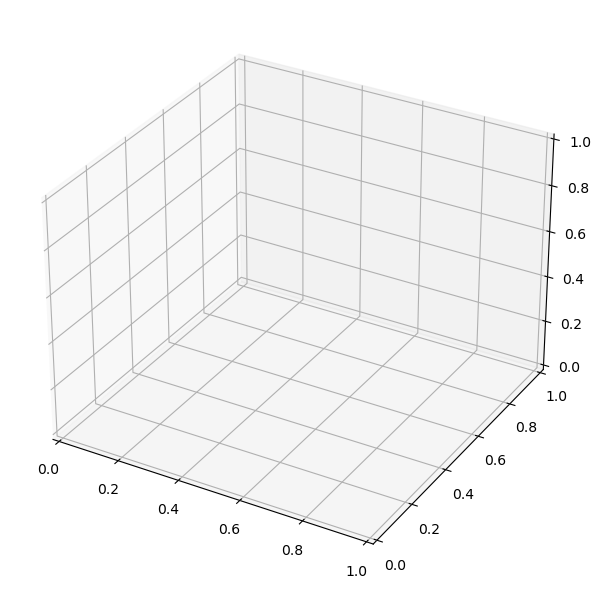

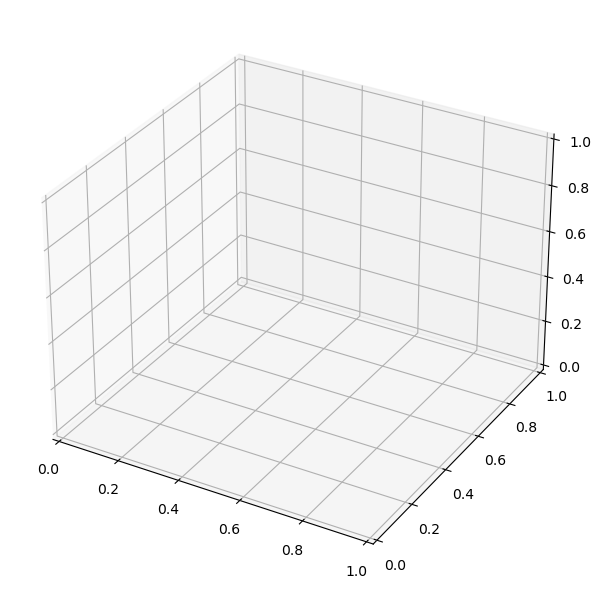

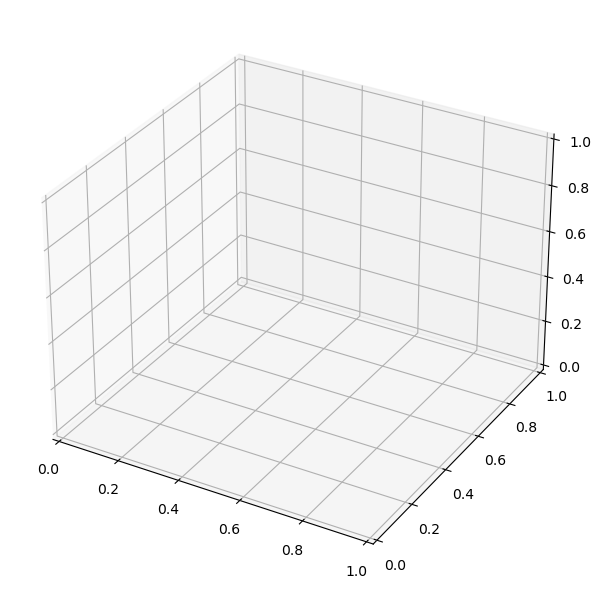

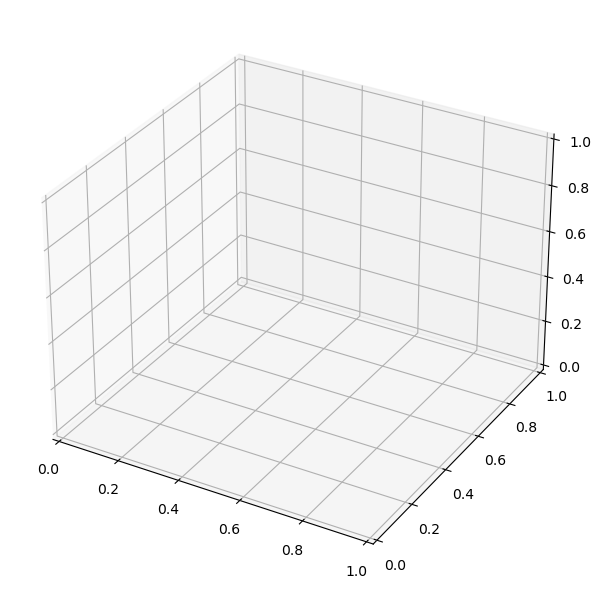

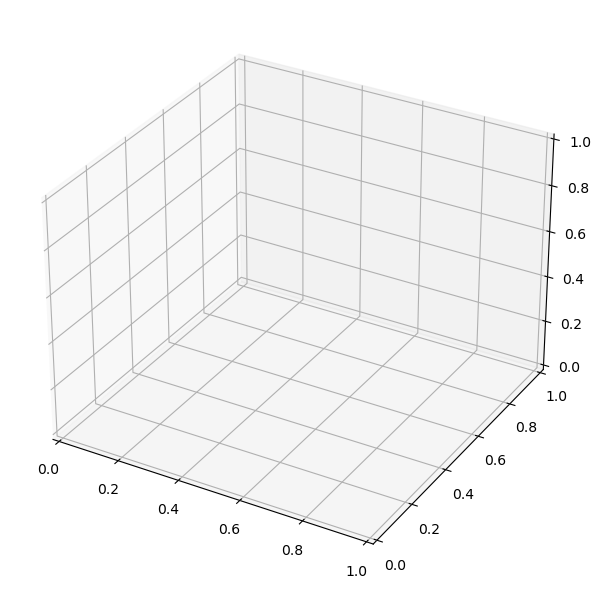

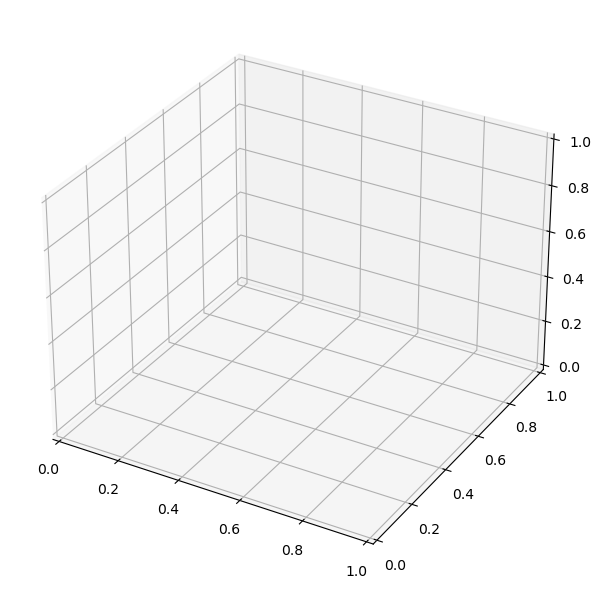

In [572]:
for event in events.values():
    video_skeleton(f'projected_{event}', new_df_test, event[0], event[1])

# OH0037, M, middle-aged, ambidextrous

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

In [271]:
#Load data
data_path = "../data/OH0037.csv"
data = pd.read_csv(data_path)
df = data[['rgb_frameid', 'kp3ds']]
#Convert data into float values and get body points
df['kp3ds'] = df['kp3ds'].apply(str2float)
df_points = get_df_points(df)
df = pd.concat([df, df_points], axis=1)
df.drop(columns=['kp3ds'], inplace=True)
#Convert frameid into time
df['rgb_frameid'] = (df['rgb_frameid'])/30
df.rename(columns={'rgb_frameid': 'time'}, inplace=True)
df.rename(columns = {'point_0': 'nose', 'point_1': 'lefteye',
                          'point_2': 'righteye', 'point_3': 'leftear', 'point_4': 'rightear',
                          'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                          'point_8':'rightelbow', 'point_7':'leftelbow', 
                          'point_10':'rightwrist', 'point_9':'leftwrist',
                          'point_12':'righthip', 'point_11':'lefthip',
                          'point_13': 'leftknee', 'point_14': 'rightknee',
                          'point_15': 'leftfoot', 'point_16': 'rightfoot'}, inplace = True)
#To convert into meters
df = df/1000
joints = ['leftshoulder_flex', 'rightshoulder_flex', 'leftshoulder_abduc',
       'rightshoulder_abduc', 'leftelbow_flex', 'rightelbow_flex',
       'trunk_forward_flex', 'trunk_lateral_flex', 'trunk_rotation']

# Add joints DoF
add_joint_angles(df)
add_joint_velocities(df, joints)
df.head(2)

,time,nose,lefteye,righteye,leftear,rightear,leftshoulder,rightshoulder,leftelbow,rightelbow,...,trunk_rotation,leftshoulder_flex_w,rightshoulder_flex_w,leftshoulder_abduc_w,rightshoulder_abduc_w,leftelbow_flex_w,rightelbow_flex_w,trunk_forward_flex_w,trunk_lateral_flex_w,trunk_rotation_w
0,0.000000,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000033,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [268]:
# Convert all points to meters
joints = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot']

## Get features

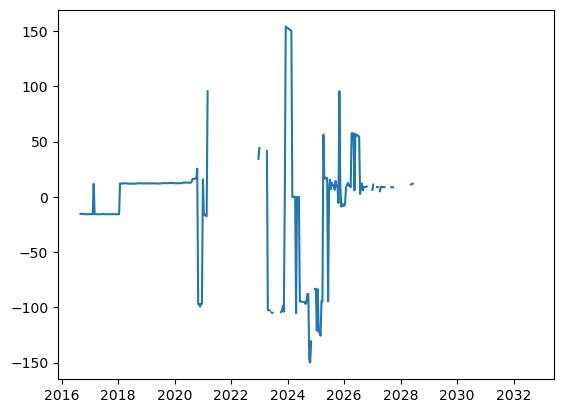

In [25]:
plt.plot(df['time'][60500:61000], df['leftshoulder_flex'][60500:61000])

In [ ]:

fig = px.scatter_3d(x = [point[0] for point in df['leftelbow'][60500:61000]], 
                    y = [point[1] for point in df['leftelbow'][60500:61000]], 
                    z = [point[0] for point in df['leftelbow'][60500:61000]])
fig.show()

In [94]:
#plt.plot(df['leftshoulder_flex'][60000:61000])
def plot_trajectory(data, t1, t2, joint, event):
    xdata = [point[0] for point in data[joint][t1: t2]]
    ydata = [point[1] for point in data[joint][t1: t2]]
    zdata = [point[2] for point in data[joint][t1: t2]]

    fig = px.line_3d(x = xdata, y = ydata, z = zdata, title=f'{joint} while {event}')
    fig.show()
    """
    fig = plt.figure(figsize=(10,10))
    ax = plt.axes(projection='3d')
    ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens')
    ax.set_title(f'{joint} trajectory when {event}')
    """
plot_trajectory(df, 60500, 61000, 'leftelbow', 'blbl')

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [84]:
df['leftelbow'][60000:61000].shape[0]

500

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x183479a80>
Traceback (most recent call last):
  File "/Users/changling/opt/anaconda3/envs/skproject/lib/python3.11/site-packages/matplotlib/transforms.py", line 209, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id(self): pop(k))

KeyboardInterrupt: 


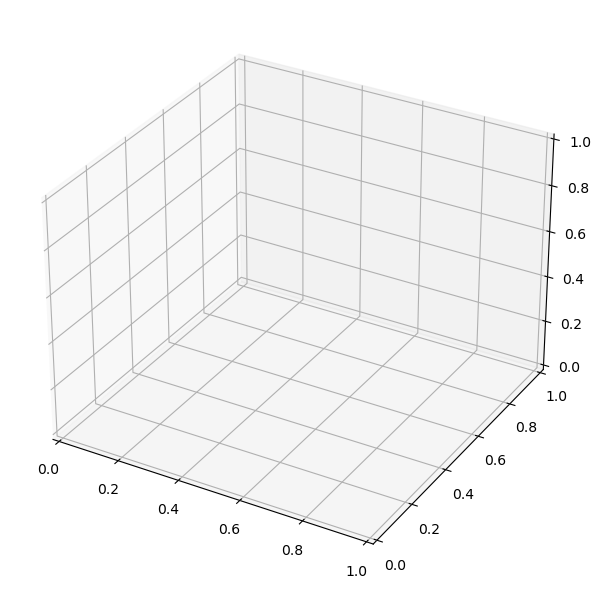

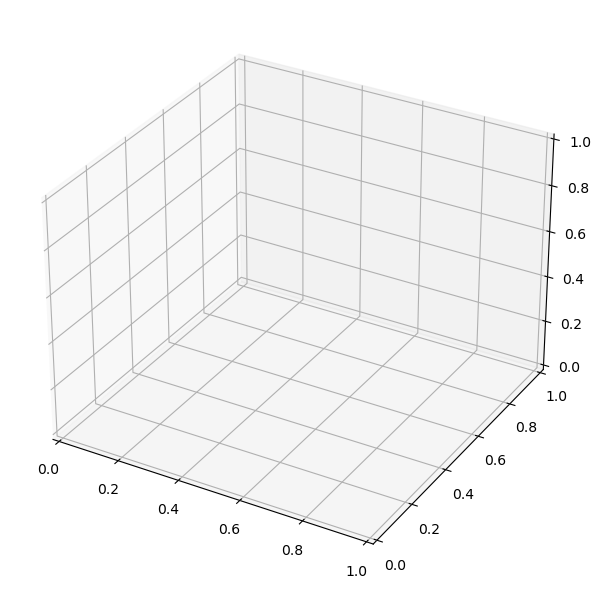

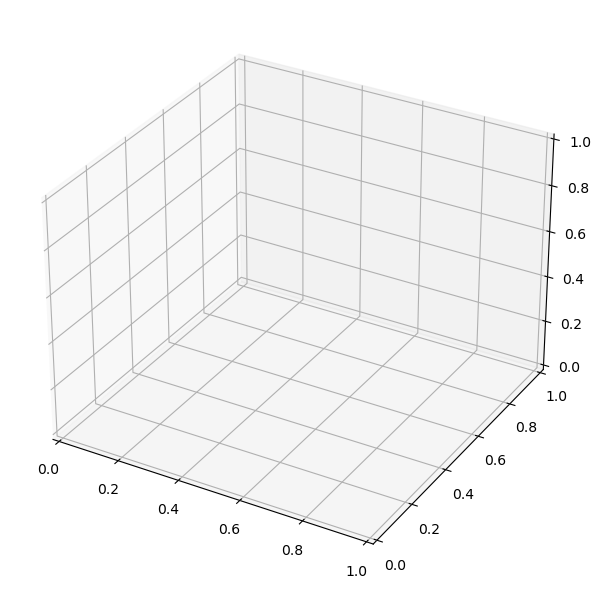

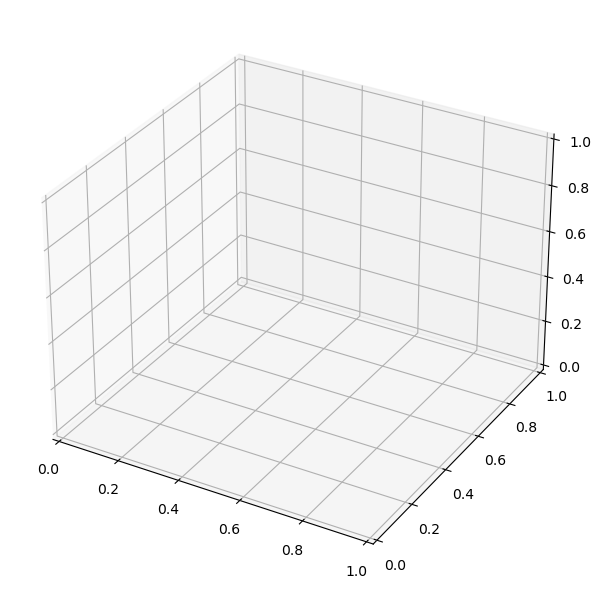

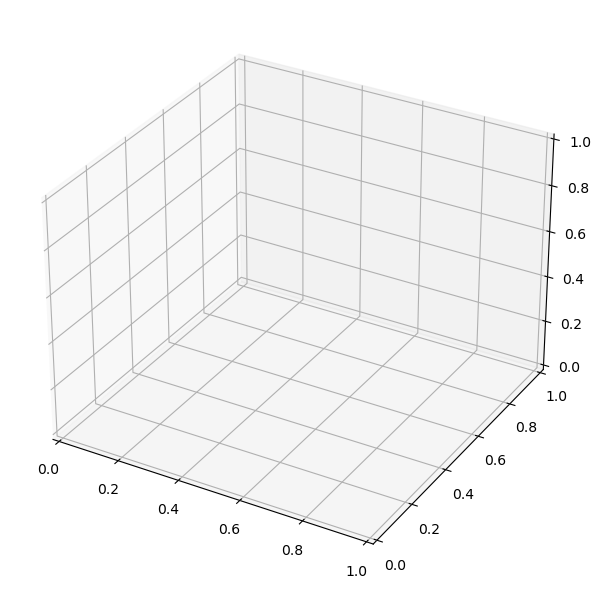

...

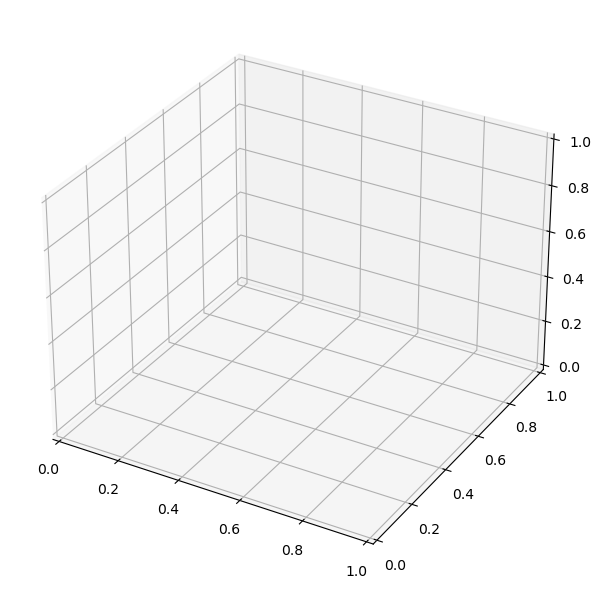

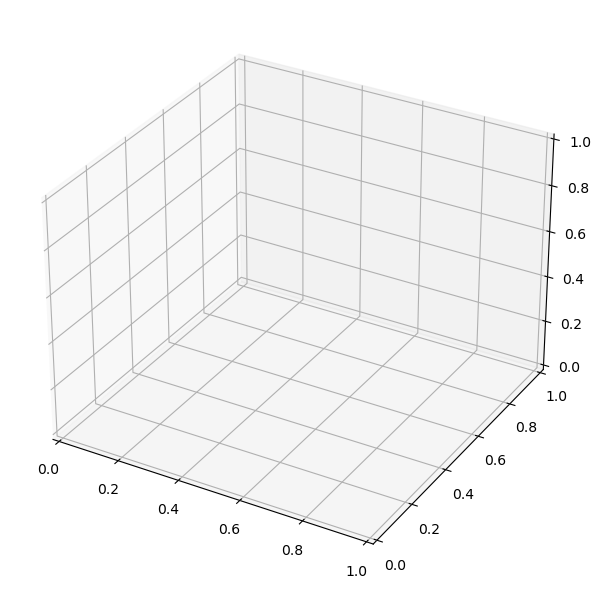

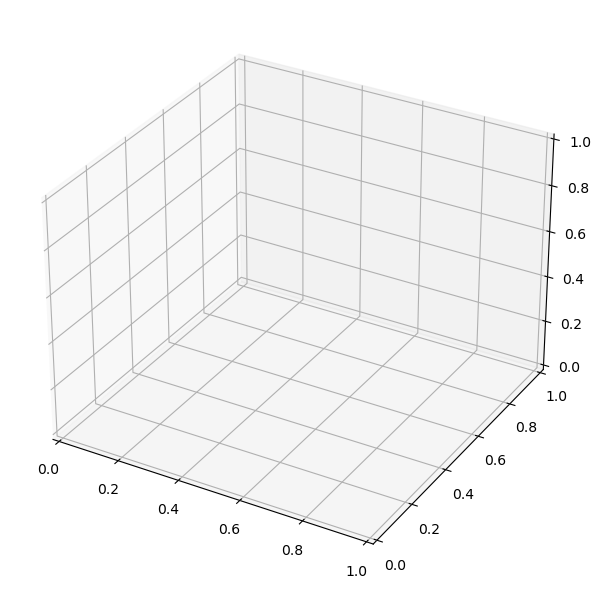

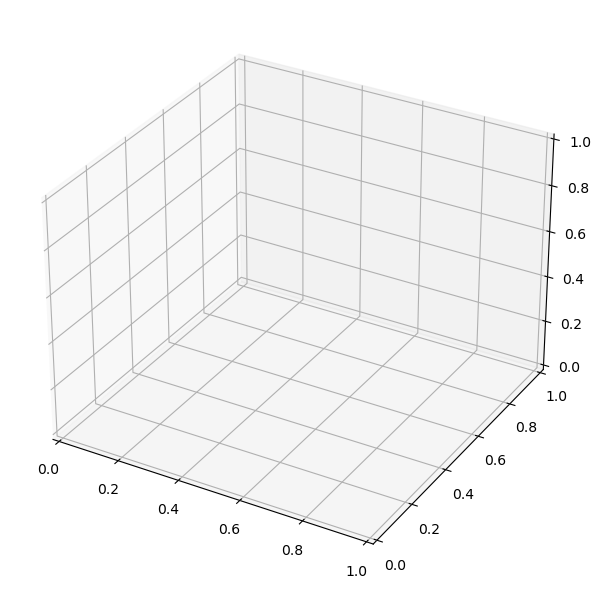

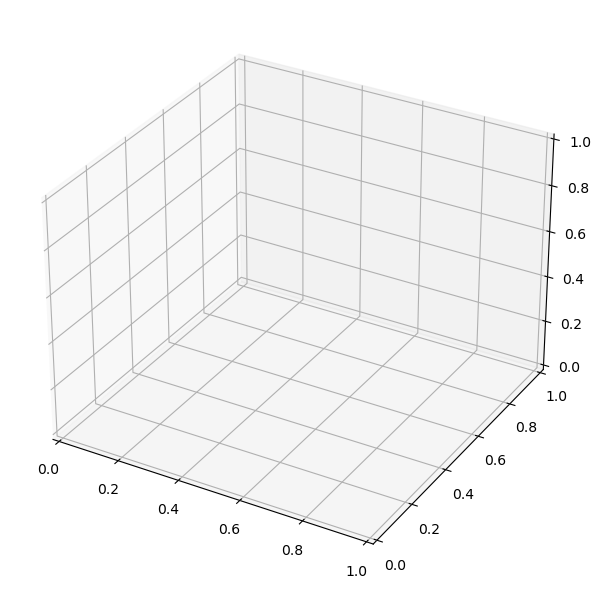

In [180]:
skeleton_frames(df, 3500, 3600)


(<unknown>:79890): GStreamer-CRITICAL **: 10:33:16.466: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@28715.058] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements


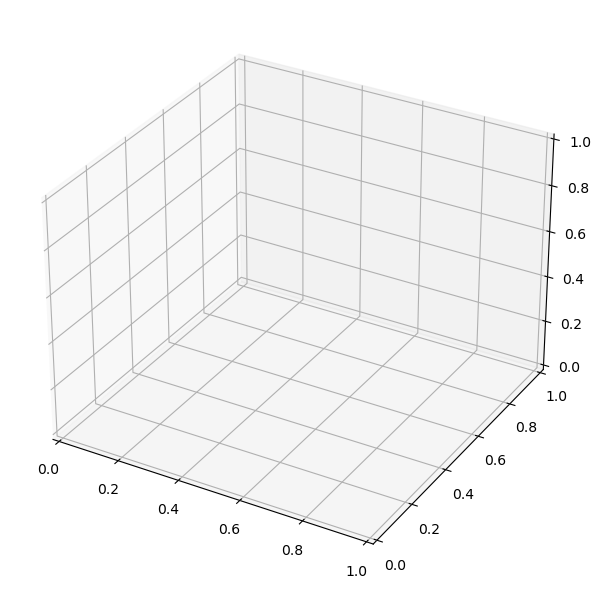

In [253]:
video_skeleton('my_data6', df, 2000, 2010)